In [687]:
import matplotlib.pyplot as plt
import numpy as np
import opensimplex
import scipy.stats as st
from PIL import Image, ImageFilter
import pandas as pd
from tqdm.notebook import tqdm
Image.MAX_IMAGE_PIXELS = None

# LOADING

In [310]:
mapWidth = 8192
mapHeight = 3072

### Load locators
locatornames = {
    'city_locators': {},
    'fort_locators': {},
    'great_work_locators': {}
}
locators=[]

for key in locatornames:
    with open(f'input files/locators/{key}.txt', 'r') as file:
        contents = file.read().splitlines()
        for line in range(8, len(contents)-4, 6):
            ids = int(contents[line].split("=")[1])
            temp = contents[line+1].split(" ")[1:-1]

            locators.append([float(temp[0])/2, (mapHeight*2-float(temp[2]))/2])

In [184]:
desertMap = Image.open('input files/desert.png')
desertMap = desertMap.resize(size=(mapWidth, mapHeight), resample=Image.Resampling.LANCZOS)
desertMap = np.array(desertMap)

drylandsMap = Image.open('input files/drylands.png')
drylandsMap = drylandsMap.resize(size=(mapWidth, mapHeight), resample=Image.Resampling.LANCZOS)
drylandsMap = np.array(drylandsMap)

flatlandsMap = Image.open('input files/flatlands.png')
flatlandsMap = flatlandsMap.resize(size=(mapWidth, mapHeight), resample=Image.Resampling.LANCZOS)
flatlandsMap = np.array(flatlandsMap)

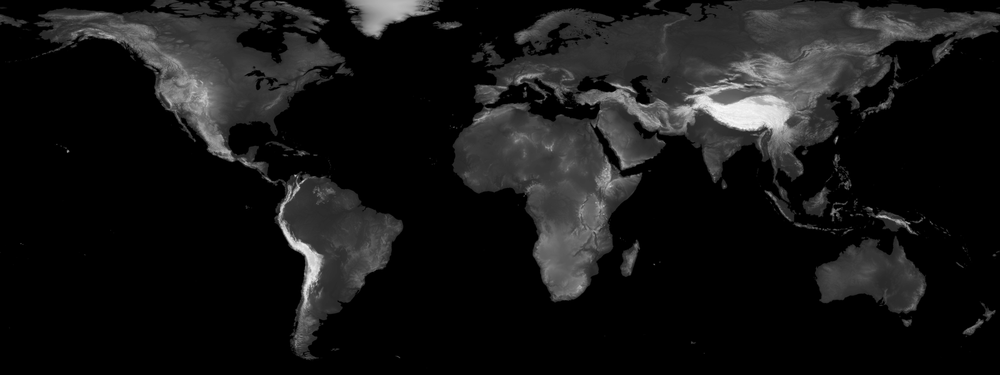

In [102]:
heightmap = Image.open('input files/heightmap.png')
heightmap = heightmap.resize(size=(mapWidth, mapHeight), resample=Image.Resampling.LANCZOS)
display(heightmap)
heightmap = np.array(heightmap)

# COMPUTE

In [671]:
def linearMap(number, prevMin, prevMax, nextMin, nextMax):
    number = (number-prevMin)/(prevMax-prevMin)
    number = nextMin+number*(nextMax-nextMin)
    return number

def heightFunc(height):
    if height<50: factor = 0.05*height-1.5
    else: factor = -height/190+24/19
    return factor

def nearEquator(y):
    temp = abs(y-1575)
    if temp<400: return True
    elif temp<550:
        temp2 = np.random.normal(loc=550-temp, scale=75)
        if temp2>75: return True
        else: return False
    else: return False

In [695]:
maskNames = ['oak_tree_mask.png','pine_tree_mask.png','rock_mask.png','rock_red_mask.png','tree_africa_mask.png','tree_cypress_mask.png','tree_india_mask.png','tree_olive_mask.png','tree_palm_mask.png','tree_persia_mask.png']
layerReds = [
    250,    # Oak
    225,    # Pine
    200,    # Rock
    175,    # Red rock
    150,    # Africa
    125,    # Cypress
    100,    # India
    75,     # Olive
    50,     # Palm
    25,     # Persia
    0       # Nothing
]
# Layers:       Oak     Pine    Rock        Red rock    Africa  Cypress India   Olive   Palm    Persia  Nothing
BiomeDesert =   [0,     0,      0.005,      0.005,      0.10,   0,      0,      0,      0.09,   0,      0.8]
BiomeDrylands = [0,     0,      0.01,       0.03,       0.10,   0,      0,      0.11,   0.15,   0,      0.6]
BiomeCoastal =  [0,     0,      0.2,        0,          0,      0,      0,      0,      0,      0,      0.8]
BiomeH100 =     [0.05,  0.34,   0.01,       0,          0,      0.1,    0,      0,      0,      0,      0.5]
BiomeFlatlands =[0.21,  0,      0.01,       0,          0,      0.08,   0,      0,      0,      0,      0.7]
BiomeTemperate =[0.4,   0.19,   0.01,       0,          0,      0,      0,      0,      0,      0,      0.4]
BiomeEquatorial=[0,     0,      0.01,       0,          0,      0,      0.30,   0,      0,      0.29,   0.4]

In [696]:
def probFunc(height, i, j, simplexRandom):
    if height<40: biome = BiomeCoastal
    elif height>100: biome = BiomeH100
    elif desertMap[i,j]==255: biome = BiomeDesert
    elif drylandsMap[i,j]==255: biome = BiomeDrylands
    elif flatlandsMap[i,j]==255: biome = BiomeFlatlands
    elif nearEquator(i): biome = BiomeEquatorial
    else: biome = BiomeTemperate

    biome = np.cumsum([int(x*200) for x in biome])
    for k in range(11):
        if simplexRandom<=biome[k]:break

    return layerReds[k]

In [691]:
voidsFactor = 0.05
opensimplex.seed(np.random.randint(0,10000))

noise = np.empty((mapHeight, mapWidth))
yOff = 0
for i in range(mapHeight):
    xOff = 0
    for j in range(mapWidth):
        #noise[i,j] = linearMap(opensimplex.noise2(x=xOff, y=yOff), -1, 1, 0, 200)
        temp = opensimplex.noise2(x=xOff, y=yOff)
        if temp<0: noise[i,j] = 0
        else: noise[i,j] = 90
        xOff += voidsFactor
    yOff += voidsFactor

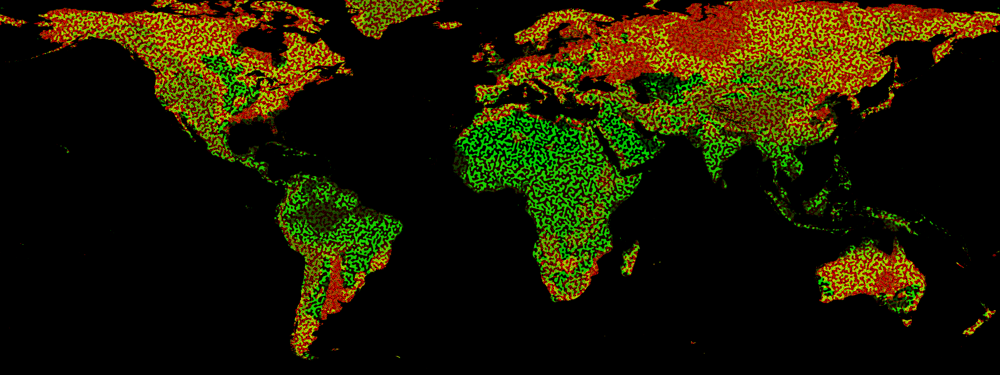

In [700]:
master = Image.new(mode='RGB', size=(mapWidth, mapHeight))
master = np.array(master)

factor = 0.2
np.random.seed()
opensimplex.seed(np.random.randint(0,10000))
yOff = 0
for i in range(mapHeight):
    xOff = 0
    for j in range(mapWidth):
        simplexRandom = (opensimplex.noise2(x=xOff, y=yOff)+1)*100
        intensity = noise[i,j]
        height = heightmap[i,j]
        
        if height<25 or height>240: continue
        intensity *= heightFunc(height)
        master[i,j,1] = intensity

        biome = probFunc(height, i, j, simplexRandom)
        master[i,j,0] = biome
        xOff += factor
    yOff += factor

master = Image.fromarray(master)
display(master)

# Removing layers around locators

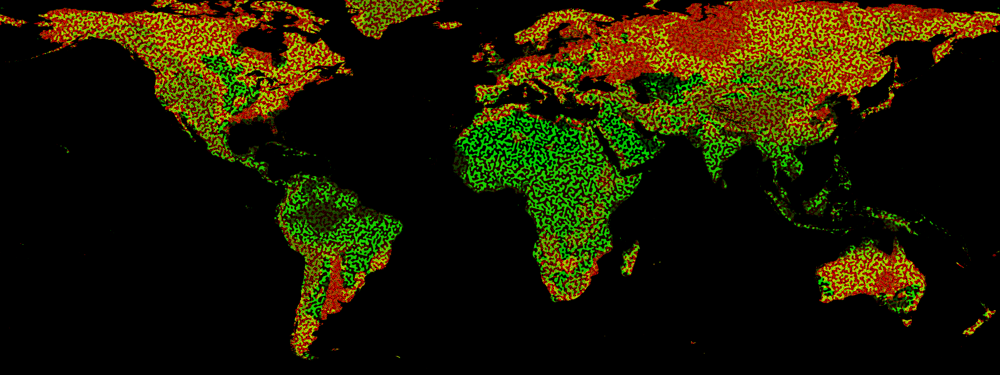

In [701]:
master = np.array(master)
constant = (8**2+8**2)**0.5+0.001
for locator in locators:
    x = round(locator[1])
    y = round(locator[0])
    for i in list(range(-8,9)):
        for j in list(range(-8,9)):
            xi, yj = x+i, y+j
            if xi<0 or yj<0: continue
            elif xi>mapHeight-1 or yj>mapWidth-1: continue

            dist = (i**2+j**2)**0.5
            if dist<constant: master[i,j,0:2] = 0, 0

master = Image.fromarray(master)
display(master)

# Output

In [702]:
r, g, b = np.array(master).T

for i in range(len(maskNames)):
    name = maskNames[i]
    red = layerReds[i]

    area = (r == red)
    output = np.array(Image.new(mode='L', size=(mapWidth, mapHeight)))
    output[area.T] = g[area].T

    output = Image.fromarray(output)
    output.save('output files\\'+name)